## Introduction 

Hello! This is my very first Kernel. It is meant to give a grasp of a problem of speech representation. I'd also like to take a look on a features specific to this dataset. 

Content:<br>
* [1. Visualization of the recordings - input features](#visualization)
   * [1.1. Wave and spectrogram](#waveandspectrogram)
   * [1.2. MFCC](#mfcc)
   * [1.3. Sprectrogram in 3d](#3d)
   * [1.4. Silence removal](#resampl)
   * [1.5. Resampling - dimensionality reductions](#silenceremoval)
   * [1.6. Features extraction steps](#featuresextractionsteps)
* [2. Dataset investigation](#investigations)
   * [2.1. Number of files](#numberoffiles)
   * [2.2. Mean spectrograms and fft](#meanspectrogramsandfft)
   * [2.3. Deeper into recordings](#deeper)
   * [2.4. Length of recordings](#len)
   * [2.5. Note on Gaussian Mixtures modeling](#gmms)
   * [2.6. Frequency components across the words](#components)
   * [2.7. Anomaly detection](#anomaly)
* [3. Where to look for the inspiration](#wheretostart)

All we need is here:

## 데이터의 특징

총 65,000개의 1초 내외의 음성파일

- 31개 폴더 : "Yes", "No", "Up", "Down", "Left", "Right", "On", "Off", "Stop", "Go", "Zero", "One", "Two", "Three", "Four", "Five", "Six", "Seven", "Eight", "Nine", "Bed", "Bird", "Cat", "Dog", "Happy", "House", "Marvin", "Sheila", "Tree", "Wow", "_background_noise_"존재 </br>



- 20개 core words : "Yes", "No", "Up", "Down", "Left", "Right", "On", "Off", "Stop", "Go", "Zero", "One", "Two", "Three", "Four", "Five", "Six", "Seven", "Eight", and "Nine"</br>


- 나머지 10개가 auxiliary words : "_background_noise_"는 제외  : 보조단어</br>


- core words 중 "Yes", "No", "Up", "Down", "Left", "Right", "On", "Off", "Stop", "Go"가 Test에서 예측을 위해 쓰임

In [1]:
import py7zr

import os
for dirname, _, filenames in os.walk('./input/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
if not os.path.exists('./input/train/') :
    os.makedirs('./input/train/')

if not os.path.exists('./input/test/') :
    os.makedirs('./input/test/')

with py7zr.SevenZipFile("./input/train.7z", 'r') as archive:
    archive.extractall(path="./input/train/")

with py7zr.SevenZipFile("./input/test.7z", 'r') as archive:
    archive.extractall(path="./input/test/")

for dirname, _, filenames in os.walk('./input/'): 
    for filename in filenames: 
        print(os.path.join(dirname, filename))

./input/link_to_gcp_credits_form.txt
./input/sample_submission.7z
./input/test.7z
./input/train.7z
./input/보조.ipynb
./input/.ipynb_checkpoints\보조-checkpoint.ipynb
./input/link_to_gcp_credits_form.txt
./input/sample_submission.7z
./input/test.7z
./input/train.7z
./input/보조.ipynb
./input/.ipynb_checkpoints\보조-checkpoint.ipynb
./input/test\test\audio\clip_000044442.wav
./input/test\test\audio\clip_0000adecb.wav
./input/test\test\audio\clip_0000d4322.wav
./input/test\test\audio\clip_0000fb6fe.wav
./input/test\test\audio\clip_0001d1559.wav
./input/test\test\audio\clip_0002256ed.wav
./input/test\test\audio\clip_0002a4a1f.wav
./input/test\test\audio\clip_0002d9b83.wav
./input/test\test\audio\clip_000373a5b.wav
./input/test\test\audio\clip_0003c7122.wav
./input/test\test\audio\clip_0003e6aee.wav
./input/test\test\audio\clip_00049951d.wav
./input/test\test\audio\clip_0004c6707.wav
./input/test\test\audio\clip_0004f8b63.wav
./input/test\test\audio\clip_00068e281.wav
./input/test\test\audio\clip_

In [2]:
!pip install librosa

  Created wheel for audioread: filename=audioread-2.1.9-py3-none-any.whl size=23154 sha256=302a684b4e77df272d4b4811e0b4e8ba85a9598b0198ec7043b299da774fba62
  Stored in directory: c:\users\home\appdata\local\pip\cache\wheels\a2\a3\bd\ec1568ce7515115a11ab686d509ad302124c782af065de47ee
  Created wheel for resampy: filename=resampy-0.2.2-py3-none-any.whl size=320731 sha256=b9c8577efbb9c6c13842da65198ca26606ada0721ee1eeba0bbdb6a5f0e58659
  Stored in directory: c:\users\home\appdata\local\pip\cache\wheels\86\2c\7d\46a32a246b0e5939cea2c5ec1492164073e0c5d16d666ae2cd
Successfully built audioread resampy


In [3]:
import os
from os.path import isdir, join
from pathlib import Path
import pandas as pd

# Math
import numpy as np
from scipy.fftpack import fft # fast-fourier transforms
from scipy import signal
from scipy.io import wavfile
import librosa # librosa는 음악 및 오디오 분석을 위한 파이썬 패키지입니다. 음악 정보 검색 시스템을 만드는 데 필요한 구성 요소를 제공합니다.


from sklearn.decomposition import PCA

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import librosa.display

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import pandas as pd

%matplotlib inline


# 1. Visualization 
<a id="visualization"></a> 

There are two theories of a human hearing - place ( https://en.wikipedia.org/wiki/Place_theory_(hearing) (frequency-based) and temporal (https://en.wikipedia.org/wiki/Temporal_theory_(hearing) )
In speech recognition, I see two main tendencies - to input [spectrogram](https://en.wikipedia.org/wiki/Spectrogram) (frequencies), and more sophisticated features MFCC - Mel-Frequency Cepstral Coefficients, PLP. You rarely work with raw, temporal data.

Let's visualize some recordings!

## 1.1. Wave and spectrogram:
<a id="waveandspectrogram"></a> 

Choose and read some file:

In [4]:
train_audio_path = './input/train/train/audio/'
filename = 'yes/0a7c2a8d_nohash_0.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename) # sample_rate = 160000Hz

In [7]:
print(sample_rate) 

16000


In [8]:
print(samples)

[ 14  -7 -14 ...  19  20  27]


스펙트로그램을 계산하는 함수를 정의합니다.

참고: 스펙트로그램 값의 대수를 취합니다. 그러면 우리의 줄거리가 훨씬 더 분명해질 것이고, 게다가 그것은 사람들이 듣는 방식과 엄격히 연결되어 있습니다.
로그 입력값으로 0이 없음을 확인해야 합니다.

이 음성 파일을 시각화하여 살펴보자. 음성은 시간, 주파수, 진폭(amplitude)으로 이루어져 있다. 하지만 단순하게 spectrum 그래프를 그리면 이 세 가지 요소를 동시에 살펴볼 수 없다. 그래서 신호의 spectral content의 시간 변위를 표시하는 시간, 주파수에 대한 2차 함수인 Spectrogram을 계산해야 한다.



In [5]:
def log_specgram(audio, sample_rate, window_size=20,
                 step_size=10, eps=1e-10):
    # nperseg: Length of each segment
    # noverlap: 세그먼트 간에 겹칠 점 수입니다.
    nperseg = int(round(window_size * sample_rate / 1e3)) # 320
    noverlap = int(round(step_size * sample_rate / 1e3)) # 160
    freqs, times, spec = signal.spectrogram(audio,
                                    fs=sample_rate,
                                    window='hann',
                                    nperseg=nperseg,
                                    noverlap=noverlap,
                                    detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

In [13]:
1e3

1000.0

In [10]:
nperseg = int(round(20 * sample_rate / 1e3))
nperseg

320

In [12]:
noverlap = int(round(10 * sample_rate / 1e3))
noverlap

160

Frequencies are in range (0, 8000) according to [Nyquist theorem](https://en.wikipedia.org/wiki/Nyquist_rate).

Let's plot it:

Amplitude, Spectrogram plot 그리기

Text(0.5, 0, 'Seconds')

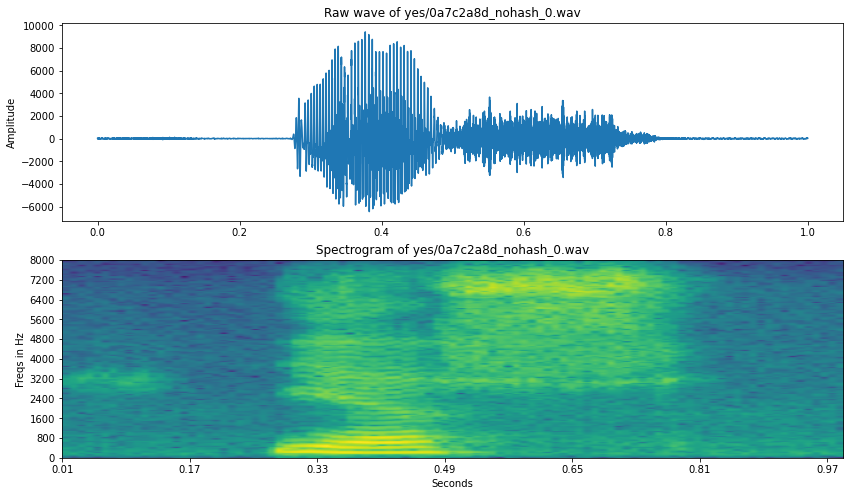

In [6]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

fig = plt.figure(figsize=(14, 8))

# amplitude(y)
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(np.linspace(0, sample_rate/len(samples), sample_rate), samples)

# freq(y) + times(x)
ax2 = fig.add_subplot(212)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])

ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

In [14]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)
print(freqs, times, spectrogram)

[   0.   50.  100.  150.  200.  250.  300.  350.  400.  450.  500.  550.
  600.  650.  700.  750.  800.  850.  900.  950. 1000. 1050. 1100. 1150.
 1200. 1250. 1300. 1350. 1400. 1450. 1500. 1550. 1600. 1650. 1700. 1750.
 1800. 1850. 1900. 1950. 2000. 2050. 2100. 2150. 2200. 2250. 2300. 2350.
 2400. 2450. 2500. 2550. 2600. 2650. 2700. 2750. 2800. 2850. 2900. 2950.
 3000. 3050. 3100. 3150. 3200. 3250. 3300. 3350. 3400. 3450. 3500. 3550.
 3600. 3650. 3700. 3750. 3800. 3850. 3900. 3950. 4000. 4050. 4100. 4150.
 4200. 4250. 4300. 4350. 4400. 4450. 4500. 4550. 4600. 4650. 4700. 4750.
 4800. 4850. 4900. 4950. 5000. 5050. 5100. 5150. 5200. 5250. 5300. 5350.
 5400. 5450. 5500. 5550. 5600. 5650. 5700. 5750. 5800. 5850. 5900. 5950.
 6000. 6050. 6100. 6150. 6200. 6250. 6300. 6350. 6400. 6450. 6500. 6550.
 6600. 6650. 6700. 6750. 6800. 6850. 6900. 6950. 7000. 7050. 7100. 7150.
 7200. 7250. 7300. 7350. 7400. 7450. 7500. 7550. 7600. 7650. 7700. 7750.
 7800. 7850. 7900. 7950. 8000.] [0.01 0.02 0.03 0.0

NN의 입력 기능으로 스펙트로그램을 사용하는 경우 기능을 정규화하는 것을 기억해야 합니다. (모든 데이터셋을 정규화해야 합니다. 이 예에서는 평균과 표준이 적절하지 않은 한 데이터셋을 예로 들어 보겠습니다.)


In [5]:
mean = np.mean(spectrogram, axis=0)
std = np.std(spectrogram, axis=0)
spectrogram = (spectrogram - mean) / std

짚고 넘어가야 할 흥미로운 사실이 있습니다. 각 프레임에는 최대 160개의 기능이 있으며 주파수는 0에서 8000 사이입니다. 즉, 하나의 기능이 50Hz에 해당합니다. 그러나 [귀의 주파수 분해능은 1000 – 2000Hz 옥타브 내에서 3.6Hz입니다](https://en.wikipedia.org/wiki/Psychoacoustics) 이것은 사람들이 위와 같은 스펙트로그램으로 표현되는 것보다 훨씬 더 정확하고 더 작은 세부사항을 들을 수 있다는 것을 의미합니다.


## 1.2. MFCC
<a id="mfcc"></a> 

MFCC에 대한 자세한 내용은 이 튜토리얼을 참조하십시오. MFCC는 인간의 청력을 흉내낼 준비가 잘 되어 있다는 것을 알 수 있습니다.
. [MFCC explained](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/) 

*librosa* python 패키지를 사용하여 *Mel 파워 스펙트로그램* 및 *MFCC*를 계산할 수 있습니다.


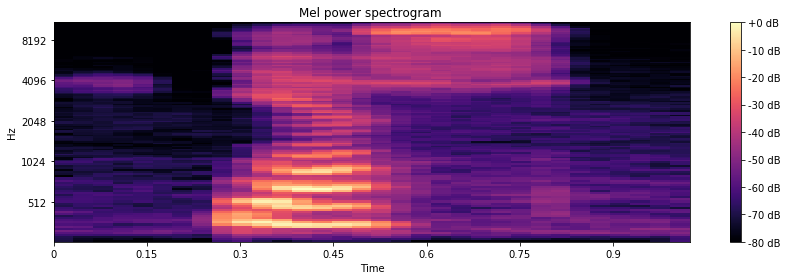

In [6]:
# From this tutorial
# https://github.com/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb
# librosa는 음악 및 오디오 분석을 위한 파이썬 패키지입니다. 음악 정보 검색 시스템을 만드는 데 필요한 구성 요소를 제공합니다.
S = librosa.feature.melspectrogram(samples, sr=sample_rate, n_mels=128)

# 로그 척도(dB)로 변환합니다. 피크 전력(최대)을 기준으로 사용합니다.
log_S = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12, 4))
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel')
plt.title('Mel power spectrogram ')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

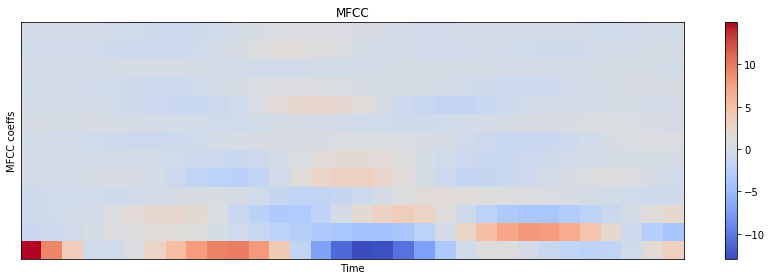

In [7]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12, 4))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

고전적이지만 여전히 최첨단 시스템에서는 *MFCC* 또는 이와 유사한 기능이 스펙트로그램 대신 시스템에 입력되는 것으로 간주됩니다.

그러나 엔드 투 엔드(종종 뉴럴 네트워크 기반) 시스템에서 가장 일반적인 입력 기능은 원시 스펙트로그램 또는 멜 파워 스펙트로그램일 것입니다. 예를 들어 *MFCC*는 피쳐를 장식하지만 NN은 상관된 피쳐를 잘 처리합니다. 또한, 만약 여러분이 멜 필터를 이해한다면, 여러분은 멜 필터의 사용이 합리적이라고 생각할 수 있습니다.a

어느 쪽을 선택할지는 당신의 결정입니다!

## 1.3. Spectrogram in 3d
<a id="3d"></a> 

By the way, times change, and the tools change. Have you ever seen spectrogram in 3d?

하지만 많은 좋은 tool이 나와서 다음과 같이 3D 그래프로도 그릴 수 있게 되었다.



In [8]:
data = [go.Surface(z=spectrogram.T)]

layout = go.Layout(
    title='Specgtrogram of "yes" in 3d',
    scene = dict(
    yaxis = dict(title='Frequencies', range=freqs),
    xaxis = dict(title='Time', range=times),
    zaxis = dict(title='Log amplitude'),
    ),
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

(축 범위를 적절한 값으로 설정하는 방법은 아직 모릅니다. 위에 있는 전형적인 스펙트로그램처럼 줄무늬가 있었으면 합니다.
